In [88]:
suppressWarnings(suppressPackageStartupMessages({
    library(Seurat)
    library(Signac)
    library(EnsDb.Hsapiens.v86)
    library(dplyr)
    library(ggplot2)
    library(bedr)
    library(SeuratDisk)
    library(scales)
    library(reshape2)
    library(Hmisc)
    library(tidyr)
    library(tidyverse)
    library(crayon)
    library(readr)
    library(reticulate)
    library(gridExtra)
    library(grid)
    library(ggpubr)
    library(scales)
}))
use_condaenv("R42")
#use_python("/home/vsevim/software/anaconda3/envs/R42/bin/python")
source_python("/home/vsevim/prj/workflows/ckd/secondary/mixture.py")
source('/home/vsevim/prj/workflows/ckd/secondary/helper_functions_for_diffex.r')

# Definitions etc

In [89]:
set.seed(1234)
options(digits=2)
stats <- c()

In [90]:
if(!exists("papermill_run")) {
    # prj_name = "Screen1_66guides"
    # # data_subdir_suffixes = "L1,L2,L3,L4"     
    # secondary_a_path = "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/"
    # save_seurat_h5 = "YES"

    prj_name = "Screen2_101vecs"
    # data_subdir_suffixes = "L1,L2,L3,L4"     
    secondary_a_path = "/home/vsevim/prj/1012-ckd/S2/analysis/secondary/"
    save_seurat_h5 = "NO"
}


In [91]:
custom_theme <- theme(
  plot.title = element_text(size=16, hjust = 0.5), 
  legend.key.size = unit(0.7, "cm"), 
  legend.text = element_text(size = 14))

### Load Seurat file

In [92]:
integrated_h5_path  <- paste0(secondary_a_path, "integrated/seurat_objects/integrated_wo_guide_calls.h5seurat")
updated_integrated_h5_path  <- paste0(secondary_a_path, "integrated/seurat_objects/integrated.h5seurat")
seurat_combined <- LoadH5Seurat(integrated_h5_path, verbose = FALSE)

Validating h5Seurat file

Warning message:
"Adding a command log without an assay associated with it"


Use only singlets (actually I didn't include the singlets in the integrated file, so this step is unnecessary)

In [93]:
seurat_combined <- subset(seurat_combined, subset = status == 'singlet')

# Call all guides

Skipping guides with less than 50 counts
Running Lib_1 
Skipping FTH1-2b 0 guides found
Skipping DE2-1a 0 guides found
Skipping DE2-1b 0 guides found
Skipping DE4-1b 31 guides found
Skipping DE6-2b 1 guides found
Skipping DE9-2a 0 guides found
Skipping DE9-2b 0 guides found
Skipping DE11-1b 39 guides found
Skipping DE13-1b 34 guides found
Skipping DE16-2a 0 guides found
Skipping NTCE1-1b 0 guides found
Skipping NTCE2-1a 0 guides found
Skipping NTCE2-1b 0 guides found
Skipping CCCE4-1b 45 guides found
Skipping DE22-2a 0 guides found
Completed Lib_1 
Running Lib_2 
Skipping FTH1-2b 0 guides found
Skipping DE2-1a 0 guides found
Skipping DE2-1b 0 guides found
Skipping DE4-1b 22 guides found
Skipping DE6-2b 6 guides found
Skipping DE9-2a 0 guides found
Skipping DE9-2b 0 guides found
Skipping DE13-1b 24 guides found
Skipping DE16-2a 0 guides found
Skipping NTCE1-1b 0 guides found
Skipping NTCE2-1a 0 guides found
Skipping NTCE2-1b 0 guides found
Skipping DE22-2a 0 guides found
Completed Lib_2

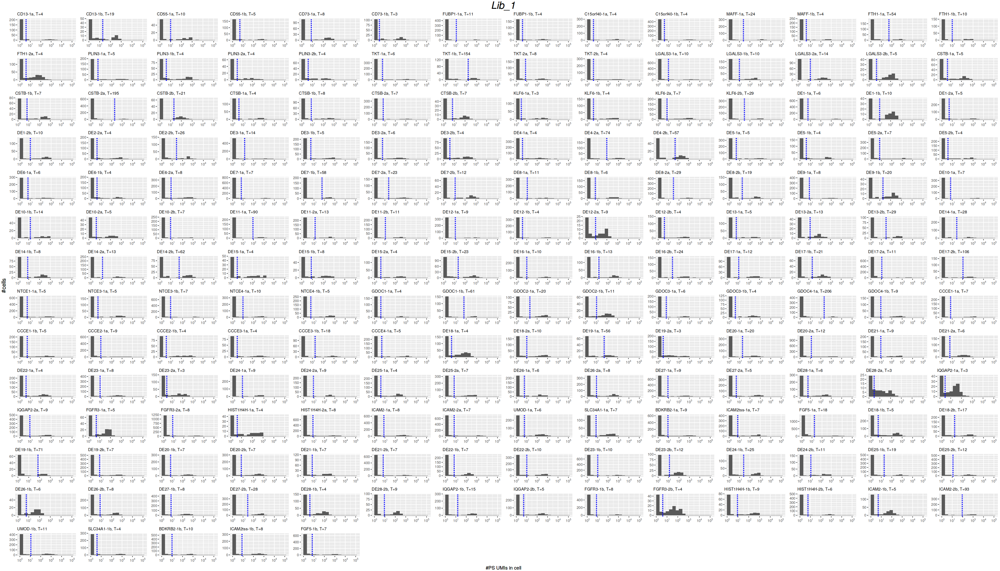

Running Lib_4 
Skipping FTH1-2b 0 guides found
Skipping DE2-1a 0 guides found
Skipping DE2-1b 0 guides found
Skipping DE6-2b 9 guides found
Skipping DE9-2a 0 guides found
Skipping DE9-2b 0 guides found
Skipping DE13-1b 10 guides found
Skipping DE16-2a 0 guides found
Skipping NTCE1-1b 0 guides found
Skipping NTCE2-1a 0 guides found
Skipping NTCE2-1b 0 guides found
Skipping DE22-2a 0 guides found
Completed Lib_4 


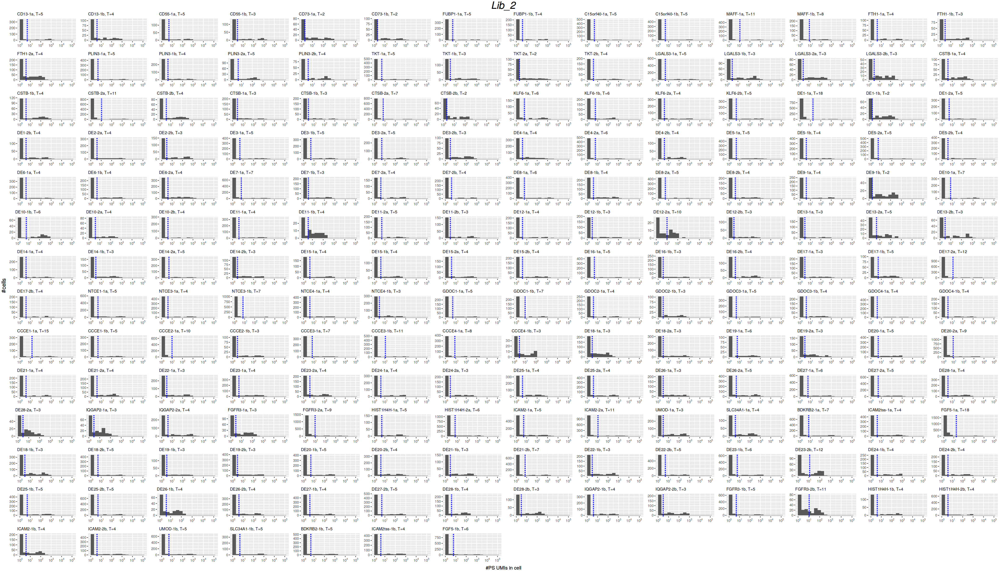

Running Lib_5 
Skipping FTH1-2b 0 guides found
Skipping DE2-1a 0 guides found
Skipping DE2-1b 0 guides found
Skipping DE4-1b 48 guides found
Skipping DE6-2b 9 guides found
Skipping DE9-2a 0 guides found
Skipping DE9-2b 0 guides found
Skipping DE13-1b 19 guides found
Skipping DE16-2a 0 guides found
Skipping NTCE1-1b 0 guides found
Skipping NTCE2-1a 0 guides found
Skipping NTCE2-1b 0 guides found
Skipping DE22-2a 0 guides found
Completed Lib_5 


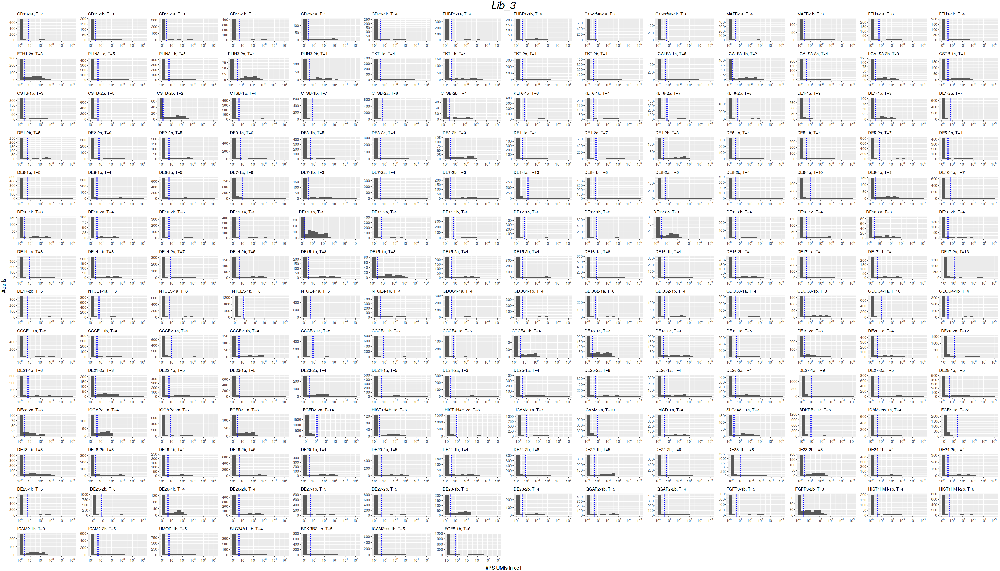

Running Lib_6 
Skipping FTH1-2b 0 guides found
Skipping DE2-1a 0 guides found
Skipping DE2-1b 0 guides found
Skipping DE6-2b 4 guides found
Skipping DE9-2a 0 guides found
Skipping DE9-2b 0 guides found
Skipping DE16-2a 0 guides found
Skipping NTCE1-1b 0 guides found
Skipping NTCE2-1a 0 guides found
Skipping NTCE2-1b 0 guides found
Skipping DE22-2a 0 guides found
Completed Lib_6 


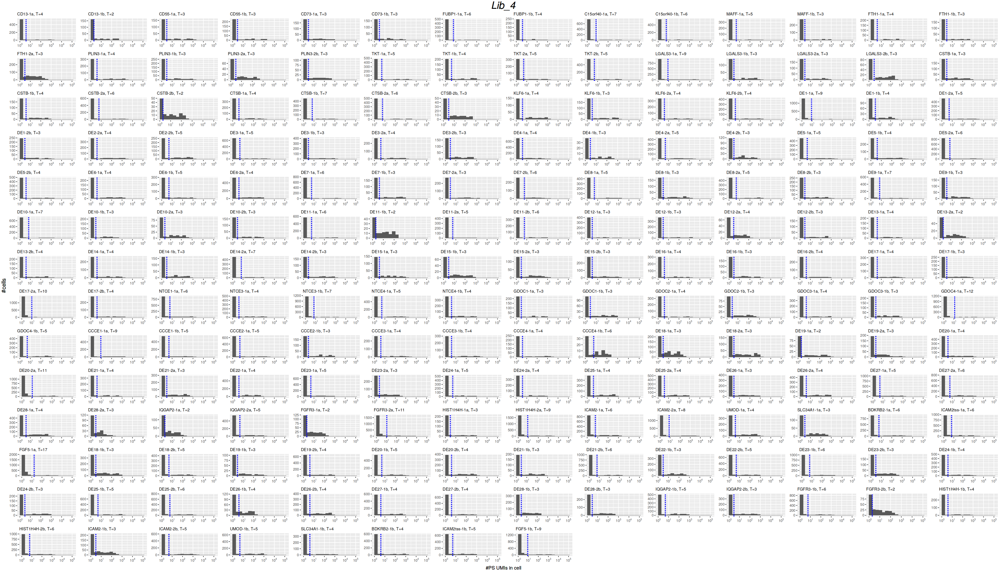

Running Lib_7 
Skipping FTH1-2b 0 guides found
Skipping DE2-1a 0 guides found
Skipping DE2-1b 0 guides found
Skipping DE4-1b 29 guides found
Skipping DE6-2b 26 guides found
Skipping DE9-2a 0 guides found
Skipping DE9-2b 0 guides found
Skipping DE13-1b 19 guides found
Skipping DE16-2a 0 guides found
Skipping NTCE1-1b 0 guides found
Skipping NTCE2-1a 0 guides found
Skipping NTCE2-1b 0 guides found
Skipping DE22-2a 0 guides found
Completed Lib_7 


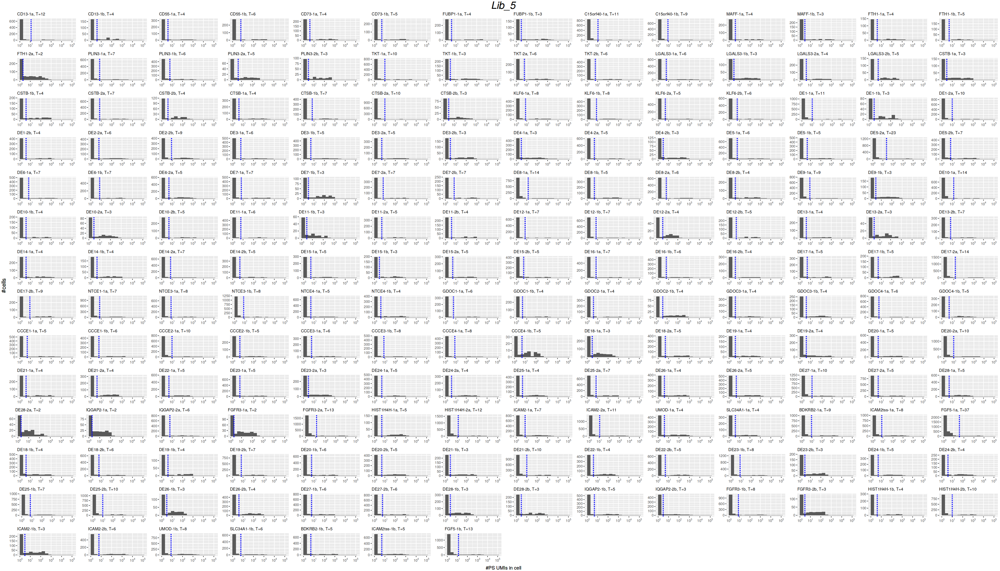

Running Lib_8 
Skipping FTH1-2b 0 guides found
Skipping DE2-1a 0 guides found
Skipping DE2-1b 0 guides found
Skipping DE6-2b 32 guides found
Skipping DE9-2a 0 guides found
Skipping DE9-2b 0 guides found
Skipping DE16-2a 0 guides found
Skipping NTCE1-1b 0 guides found
Skipping NTCE2-1a 0 guides found
Skipping NTCE2-1b 0 guides found
Skipping DE22-2a 0 guides found
Completed Lib_8 


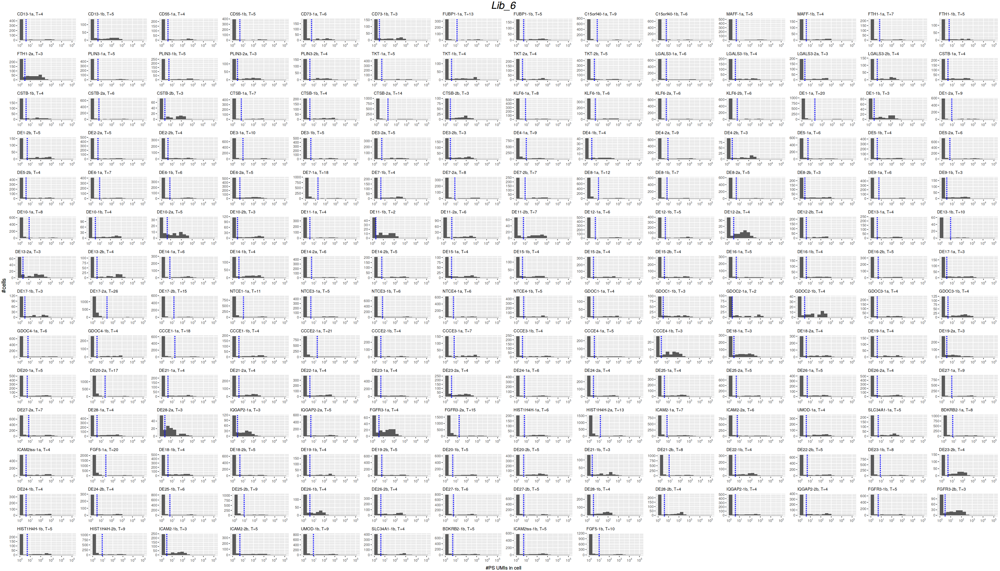

Running Lib_9 
Skipping CD55-1a 44 guides found
Skipping CD73-1a 45 guides found
Skipping CD73-1b 48 guides found
Skipping FUBP1-1a 37 guides found
Skipping FUBP1-1b 36 guides found
Skipping C15orf40-1b 47 guides found
Skipping MAFF-1a 28 guides found
Skipping MAFF-1b 38 guides found
Skipping FTH1-1a 30 guides found
Skipping FTH1-1b 23 guides found
Skipping FTH1-2b 0 guides found
Skipping PLIN3-1a 39 guides found
Skipping PLIN3-2a 21 guides found
Skipping PLIN3-2b 22 guides found
Skipping TKT-2a 37 guides found
Skipping TKT-2b 45 guides found
Skipping LGALS3-1a 50 guides found
Skipping LGALS3-1b 39 guides found
Skipping LGALS3-2a 28 guides found
Skipping LGALS3-2b 32 guides found
Skipping CSTB-1b 22 guides found
Skipping CSTB-2b 28 guides found
Skipping CTSB-1a 49 guides found
Skipping CTSB-1b 50 guides found
Skipping CTSB-2a 39 guides found
Skipping CTSB-2b 25 guides found
Skipping KLF6-1a 31 guides found
Skipping KLF6-1b 11 guides found
Skipping KLF6-2a 37 guides found
Skipping KLF6-

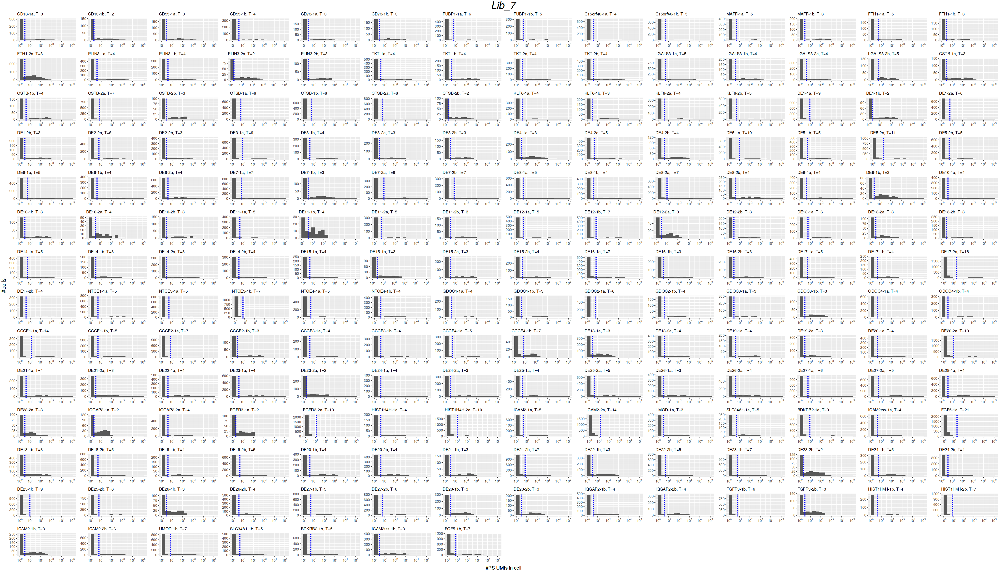

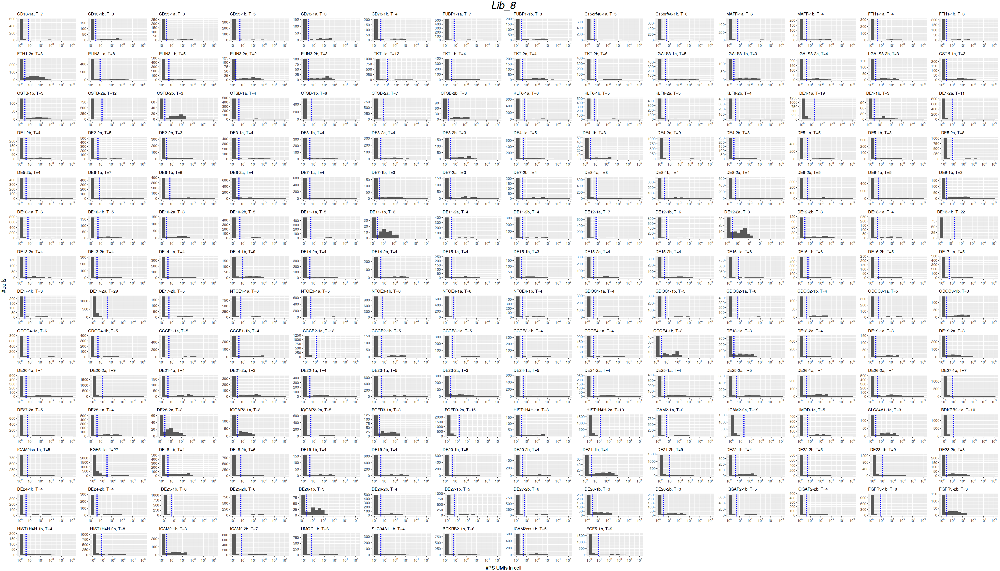

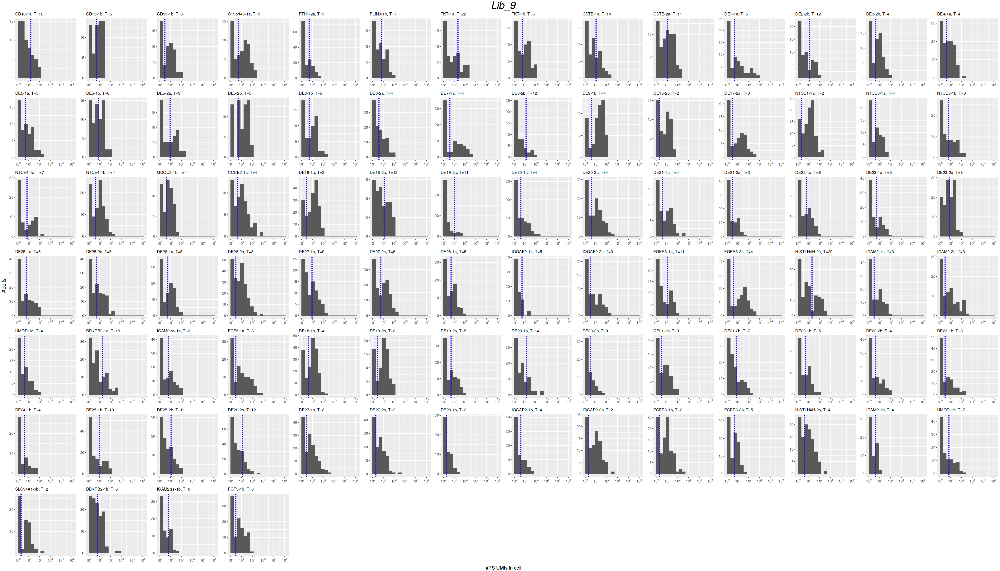

In [94]:
libraries = unique(seurat_combined$library)
min_guide_count = 50
df_thresholds = data.frame(batch=character(0), guide=character(0), threshold=numeric(0))

cat(blue("Skipping guides with less than", min_guide_count, "counts\n"))
for(l in seq_along(libraries)){
    # subset 
    library_name = libraries[[l]]
    cat(blue("Running", library_name, "\n"))
    seurat  <- subset(seurat_combined, subset = library == library_name)

    DefaultAssay(seurat) <- "sgRNA"
    df_guide_counts <- as.data.frame(t(seurat[['sgRNA']]@counts))
    rownames(df_guide_counts) <- NULL

    CUTOFF_PROB = 0.5
    guides = colnames(df_guide_counts)
    plots = list()

    for(i in seq_along(guides)) {
        guide = guides[[i]]
        y = df_guide_counts[,guide]
        select_nonzeros = y > 0
        y = y[select_nonzeros]
        if(length(y) <= min_guide_count) {
            cat("Skipping", guide, length(y), "guides found\n")
            next
        }
        
        calls <- pgmix(y)
        df_calls = as.data.frame(calls)
        df_calls['counts'] = y
        colnames(df_calls) = c('call', 'prob', 'count')
        options(repr.plot.width=4, repr.plot.height=4)
        head(df_calls)
        dim(df_calls)
        select_gaussian_assigned = df_calls[, 'prob'] > CUTOFF_PROB

        df_gauss = df_calls[select_gaussian_assigned,]
        dim(df_gauss)
        
        # head(df_gauss)
        threshold = min(df_gauss$count)
        #cat("threshold=", threshold)
        filter_y = y > 0
        y_filtered = y[filter_y]
        df_y = as.data.frame(y_filtered)
        head(df_y)
        
        options(repr.plot.width=3.3, repr.plot.height=2.4)
        bin_breaks <- c(1,2,2*2^(1:16))
        title = paste0(guide, ", T=", threshold)

        ggp1 <- ggplot(df_y, aes(x = y_filtered)) +    # Draw each column as histogram
        geom_histogram(breaks=bin_breaks) + 
        scale_x_log10(labels=trans_format('log10',math_format(10^.x)), breaks=c(1,10,100,1000,10000,100000)) +
            labs(title=title, x=NULL, y=NULL) +  
            geom_vline(xintercept=threshold, color="blue", linetype="dashed", size=1) +
            theme(plot.title = element_text(size=10))

        plots <- append(plots, list(ggp1))
        index = nrow(df_thresholds) + 1
        df_thresholds[index,] <-  c(library_name, guide, threshold)
    }
    cat(green("Completed", library_name, "\n"))
    flush.console()
    options(repr.plot.width=35, repr.plot.height=20)
    plt <- gridExtra::grid.arrange(
        grobs = plots, 
        ncol = 14, 
        bottom=textGrob("#PS UMIs in cell", gp=gpar(fontsize=12)),
        left=textGrob("#cells", gp=gpar(fontsize=14), rot=90),
        top = textGrob(library_name, gp=gpar(fontsize=25, font=3))
    )
    grid::grid.draw(plt)
    pdf_path <- "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/integrated/guide_distr/"
    ggsave(
        file = paste0(pdf_path, library_name, "_guide_distributions.pdf"), 
        plt,
        width = 22, 
        height = 17, 
        dpi = 300
    )
}

# Write thresholds to file

In [95]:
thr_f_name = paste0(secondary_a_path, "/integrated/THRESHOLDS.tsv")
head(df_thresholds)

if(save_seurat_h5 == "YES") {
    write.table(df_thresholds, thr_f_name, sep="\t", quote = F, row.names = F)
}

,batch,guide,threshold
,<chr>,<chr>,<chr>
1,Lib_1,CD13-1a,4
2,Lib_1,CD13-1b,19
3,Lib_1,CD55-1a,10
4,Lib_1,CD55-1b,5
5,Lib_1,CD73-1a,8
6,Lib_1,CD73-1b,3


In [96]:
head(df_thresholds)

,batch,guide,threshold
,<chr>,<chr>,<chr>
1,Lib_1,CD13-1a,4
2,Lib_1,CD13-1b,19
3,Lib_1,CD55-1a,10
4,Lib_1,CD55-1b,5
5,Lib_1,CD73-1a,8
6,Lib_1,CD73-1b,3


In [97]:
#head(seurat_combined@misc$stats)
rownames(seurat_combined@misc$stats) <- seurat_combined@misc$stats$Library

In [98]:
#head(seurat_combined)

In [99]:
nrow(seurat_combined@meta.data[seurat_combined@meta.data$library == 'Lib_1', ])
seurat  <- subset(seurat_combined, subset = library == 'Lib_1')
#DefaultAssay(seurat) <- "sgRNA"
nrow(seurat@meta.data)



[1] 4538

[1] 4538

# Update the Seurat object with Poission-Gaussian calls 

### Load thresholds

In [100]:
### Load THRESHOLDS.tsv
thr_f_name = paste0(secondary_a_path, "/integrated/THRESHOLDS.tsv")
df_thresholds = read.table(thr_f_name, header=T, strip.white = T)
df_thresholds <- df_thresholds %>% pivot_wider(names_from = batch, values_from = threshold)
df_thresholds <- as.data.frame(df_thresholds)
### Load guide df
df_guide = read.table("/home/vsevim/prj/1012-ckd/S1/scripts/library_csv/66CRISPRi_ref_for_diffex.txt", sep = "\t", header = T, strip.white = T)
head(df_guide)

,gene,guide1,guide2,alias,subclass,class,gene_or_rsid,label
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CD13,CD13-1a,CD13-1b,ANPEP,tss,targeting,ANPEP,Control TSS
2,CD55,CD55-1a,CD55-1b,CD55,tss,targeting,CD55,Control TSS
3,CD73,CD73-1a,CD73-1b,NT5E,tss,targeting,NT5E,Control TSS
4,FUBP1,FUBP1-1a,FUBP1-1b,FUBP1,tss,targeting,FUBP1,Control TSS
5,C15orf40,C15orf40-1a,C15orf40-1b,C15orf40,tss,targeting,C15orf40,Control TSS
6,MAFF,MAFF-1a,MAFF-1b,MAFF,tss,targeting,MAFF,Control TSS


### Get the list of pertubed cells for each guide

In [101]:
perturbed_cells_by_guide = get_perturbed_cells(seurat_combined, df_thresholds)

In [102]:
df_calls = enframe(perturbed_cells_by_guide) %>% unnest(2)
df_calls = as.data.frame(df_calls)
df_calls$guide <- as.character(df_calls$name)
df_calls$cell  <- as.character(df_calls$value)
df_calls$name <- NULL
df_calls$value <- NULL
df_calls$plasmid <- sub(".$", "", df_calls$guide)

In [103]:
df_calls_wide <- df_calls %>% 
    group_by(cell) %>% 
    summarise(
        guide_calls = paste(unique(guide), collapse = '|'), 
        plasmid_calls = paste(unique(plasmid), collapse = '|')
    )

In [104]:
df_calls_wide$n_guides   <- str_count(df_calls_wide$guide_calls, "\\|") + 1
df_calls_wide$n_plasmids <- str_count(df_calls_wide$plasmid_calls, "\\|") + 1
df_calls_wide = as.data.frame(df_calls_wide)
rownames(df_calls_wide) <- df_calls_wide$cell
df_calls_wide$cell <- NULL

In [105]:
head(df_calls_wide,20)

,guide_calls,plasmid_calls,n_guides,n_plasmids
,<chr>,<chr>,<dbl>,<dbl>
AAACCCAAGAAGGGAT-1_5,DE28-2a,DE28-2,1,1
AAACCCAAGACGTCCC-1_7,PLIN3-1b|DE10-1a|DE27-2a,PLIN3-1|DE10-1|DE27-2,3,3
AAACCCAAGGCCTGCT-1_9,DE20-2a|DE23-1a|DE20-2b|DE23-1b,DE20-2|DE23-1,4,2
AAACCCAAGGCGCTCT-1_8,CSTB-2a|NTCE1-1a|CSTB-2b,CSTB-2|NTCE1-1,3,2
AAACCCAAGTTGTCAC-1_2,C15orf40-1a|FTH1-2a|GDOC1-1b|DE20-2a|DE23-2a|DE25-2a|DE27-1a|IQGAP2-2a|DE20-2b|DE22-1b|DE23-2b|DE25-2b|DE27-1b|DE28-1b|FGF5-1b,C15orf40-1|FTH1-2|GDOC1-1|DE20-2|DE23-2|DE25-2|DE27-1|IQGAP2-2|DE22-1|DE28-1|FGF5-1,15,11
AAACCCAAGTTGTCAC-1_3,GDOC1-1b|DE20-2a|DE23-2a|DE25-2a|DE27-1a|IQGAP2-2a|DE20-2b|DE22-1b|DE23-2b|DE25-2b|DE27-1b|DE28-1b|FGF5-1b,GDOC1-1|DE20-2|DE23-2|DE25-2|DE27-1|IQGAP2-2|DE22-1|DE28-1|FGF5-1,13,9
AAACCCACAACATCGT-1_6,DE23-2a|DE27-1b,DE23-2|DE27-1,2,2
AAACCCACACAAAGTA-1_8,MAFF-1a|MAFF-1b|DE20-1a|DE20-1b,MAFF-1|DE20-1,4,2
AAACCCACACGCTATA-1_1,CCCE4-1a|HIST1H4H-2b,CCCE4-1|HIST1H4H-2,2,2


### Update the Seurat object with Poisson-Gaussian guide calls

Update the Seurat object

In [106]:
seurat_backup = seurat_combined

In [107]:
cols2rename = c('PS_call', 'construct_call', 'target_call', 'nCalled_Constructs', 'nPS_calls', 'nCalled_sgRNA_UMIs')
df_dummy = seurat_combined@meta.data
for(i in 1:length(cols2rename)) {
    colname = cols2rename[i]
    names(df_dummy)[names(df_dummy) == colname] <- paste0('cellranger_', colname) 
}

In [108]:
df_dummy = merge(df_dummy, df_calls_wide, by = 0, all.x = T)
rownames(df_dummy) <- df_dummy$Row.names
df_dummy$Row.names <- NULL
original_row_names <- rownames(seurat_combined@meta.data)
seurat_combined@meta.data = df_dummy[original_row_names,]

In [109]:
nrow(seurat_backup@meta.data)
nrow(seurat_combined@meta.data)
nrow(df_dummy)

[1] 74670

[1] 74670

[1] 74670

How many cells with no calls?

In [110]:
sum(is.na(seurat_combined$n_plasmids))

[1] 41877

In [111]:
sum(rownames(seurat_combined) != rownames(seurat_backup))

[1] 0

In [112]:
nrow(df_calls_wide)
length(Cells(seurat_combined))

[1] 32793

[1] 74670

No-call cells are really not in df_calls_wide?

In [113]:
no_call_cells = rownames(seurat_combined@meta.data[is.na(seurat_combined$n_plasmids), ])
intersect(rownames(df_calls_wide), no_call_cells)

character(0)

### Add guide-called cell counts to the Misc slot

In [114]:
call_counts = c()
for(lib in rownames(seurat_combined@misc$stats)) {
    print(lib)
    seurat <- subset(seurat_combined, subset = library == lib)
    n_cells_w_a_plasmid_call = sum(seurat$n_plasmids >= 1 & !is.na(seurat$n_plasmids)) 
    call_counts = c(call_counts, n_cells_w_a_plasmid_call)    
}
seurat_combined@misc$stats$cells_w_a_plasmid = call_counts

[1] "Lib_1"
[1] "Lib_2"
[1] "Lib_3"
[1] "Lib_4"
[1] "Lib_5"
[1] "Lib_6"
[1] "Lib_7"
[1] "Lib_8"
[1] "Lib_9"


In [115]:
df_stats = seurat_combined@misc$stats
stats_out_path <- paste0(secondary_a_path, "/stats/")
stats_fname = paste0(stats_out_path, "ALL_STATS.tsv")
dir.create(stats_out_path, showWarnings = FALSE)
write.table(df_stats, file=stats_fname, quote=FALSE, sep='\t', col.names = NA)

In [116]:
stats_fname

[1] "/home/vsevim/prj/1012-ckd/S2/analysis/secondary//stats/ALL_STATS.tsv"

### Save the updated Seurat object

In [117]:
if(save_seurat_h5 == "YES") {
    SaveH5Seurat(seurat_combined, updated_integrated_h5_path, overwrite = T, verbose = F)
}

# Visualizations using the PG guide-called data

### Constructs per cell distribution

In [139]:
table(df_calls_wide$n_plasmids)


    1     2     3     4     5     6     7     8     9    10    11    12    13 
10723  7185  4692  3300  2111  1399  1017   666   490   328   219   155   106 
   14    15    16    17    18    19    20    21    22    23    24    25    26 
  103    64    40    29    29    23    31    16    14    11     6     7     3 
   27    28    29    30    32    33    34    35    38    39    42 
    4     4     4     2     2     3     1     2     1     2     1 

Warning message:
"Transformation introduced infinite values in continuous y-axis"
Warning message:
"Removed 7 rows containing missing values (`geom_bar()`)."


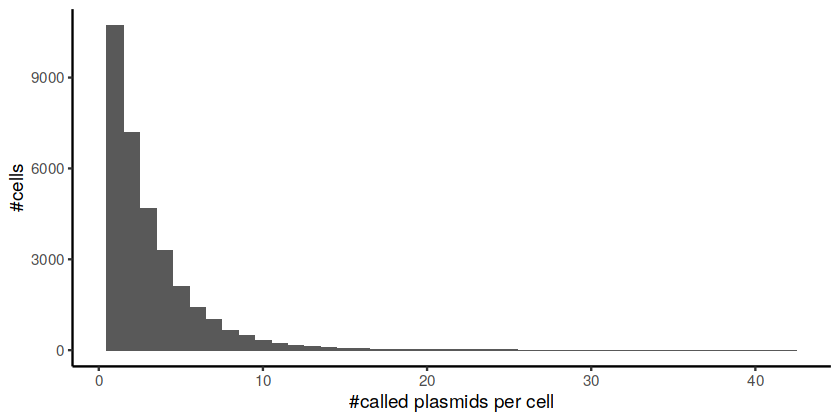

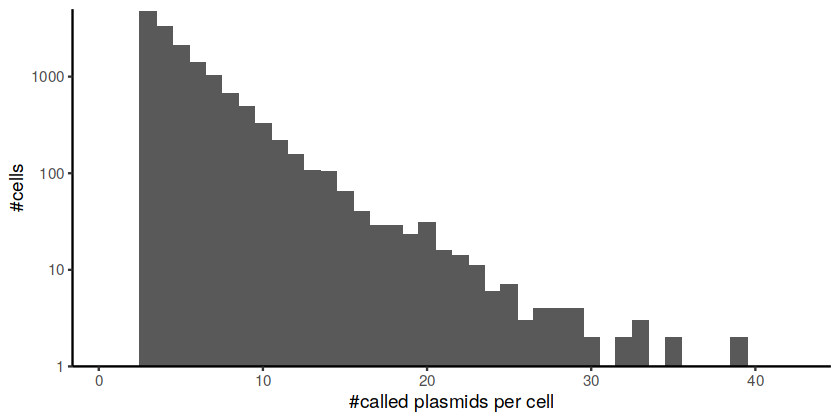

In [118]:
p5 <- ggplot(df_calls_wide, aes(x = n_plasmids)) +
    geom_histogram(binwidth=1) +
    labs(x = "#called plasmids per cell") +
    labs(y = "#cells") + 
    theme_classic() 

p6 <- ggplot(df_calls_wide, aes(x = n_plasmids)) +
    geom_histogram(binwidth=1) +
    scale_y_log10(limits = c(1, 5000), expand = c(0, 0)) +
    labs(x = "#called plasmids per cell") +
    labs(y = "#cells") +
    theme_classic() 

options(repr.plot.width=7, repr.plot.height=3.5)
p5
p6

### Plot cells per plasmid distribution

In [119]:
plasmid_calls = seurat_combined@meta.data$plasmid_calls
plasmid_calls = str_split(paste0(plasmid_calls, collapse = "|"), "\\|")
df_dummy = as.data.frame(table(plasmid_calls))
df_dummy$plasmid_calls = as.character(df_dummy$plasmid_calls)
df_dummy[df_dummy$plasmid_calls == "NA", 'plasmid_calls'] = " No Plasmid"

In [145]:
head(df_dummy, 20)

,plasmid_calls,Freq
,<chr>,<int>
1,BDKRB2-1,1592
2,C15orf40-1,802
3,CCCE1-1,799
4,CCCE2-1,701
5,CCCE3-1,573
6,CCCE4-1,363
7,CD13-1,802
8,CD55-1,649
9,CD73-1,680


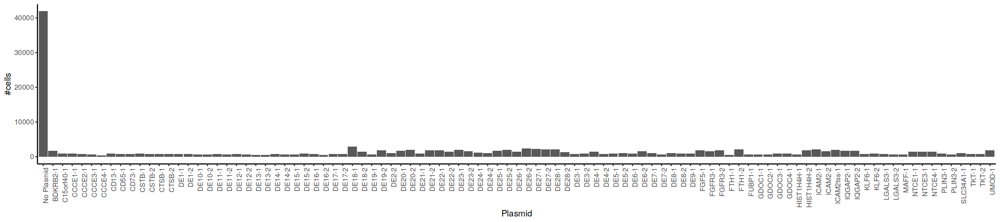

In [120]:
p6 <- ggplot(df_dummy, aes(x=plasmid_calls, y=Freq)) +
    geom_bar(stat='identity') +
    labs(x = "Plasmid") +
    theme_classic() +
    theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1)) +
    labs(y = "#cells")
    
options(repr.plot.width=18, repr.plot.height=4)
p6

In [121]:
df_dummy = df_dummy[df_dummy$plasmid_calls != " No Plasmid", ] 

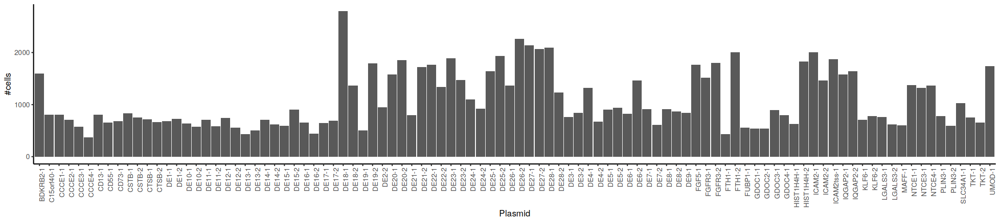

In [122]:
p6 <- ggplot(df_dummy, aes(x=plasmid_calls, y=Freq)) +
    geom_bar(stat='identity') +
    labs(x = "Plasmid") +
    theme_classic() +
    theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1)) +
    labs(y = "#cells")
    
options(repr.plot.width=18, repr.plot.height=4)
p6

Warning message:
"Removed 2 rows containing missing values (`geom_bar()`)."


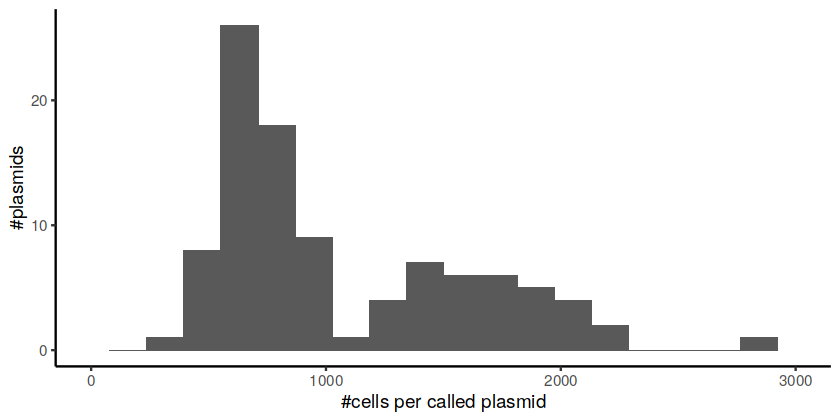

In [123]:
options(repr.plot.width=7, repr.plot.height=3.5)
ggplot(df_dummy, aes(Freq)) +
    geom_histogram(bins=20) +
    labs(x = "#cells per called plasmid") +
    labs(y = "#plasmids") +
    xlim(-1,3000) +
    theme_classic() 
    

In [124]:
length(Cells(subset(seurat_combined, subset=library=='Lib_2')))

[1] 8123

# Stats

In [125]:
df_stats = seurat_combined@misc$stats
t(df_stats)


,Lib_1,Lib_2,Lib_3,Lib_4,Lib_5,Lib_6,Lib_7,Lib_8,Lib_9
Cells_after_QC_filtering,4838,8780,11348,11132,10288,9386,11020,11252,4966
Cells_recovered,5634,9602,12665,12672,11545,10179,12692,12447,5514
Cells_with_sgRNA_count_less_than_100,2907,5821,7163,7170,6044,5547,6957,6794,4504
Doublets_in_filtered_cells,299,590,1016,1158,1150,1071,1121,1253,192
Genes_recovered,29924,29337,30603,30601,30582,28811,29658,29491,29307
Library,Lib_1,Lib_2,Lib_3,Lib_4,Lib_5,Lib_6,Lib_7,Lib_8,Lib_9
Max_mito_perc_threshold,27,27,27,26,26,26,24,24,14
Max_n_RNA_threshold,63813,42769,57269,50185,61371,33967,27310,28522,37029
Max_n_genes_threshold,11037,13024,16146,14768,16709,9677,9948,10064,8335
Min_mito_perc_threshold,3,3,3,3,3,3,3,3,3


# Debug

In [126]:
libraries = unique(seurat_combined$library)
seurat_libs = list()
for(i in seq_along(libraries)){ 
    lib = libraries[i]
    seurat_libs[[i]] = subset(seurat_combined, subset = library == lib)
}
names(seurat_libs) <- libraries

In [127]:
dummy_pert_a = get_all_perturbed_cells_by_guide(seurat_libs, df_thresholds)
dummy_pert_b = get_perturbed_cells(seurat_combined, df_thresholds)

In [128]:
length(dummy_pert_a$'DE6-1b')
length(dummy_pert_b$'DE6-1b')

[1] 611

[1] 611

In [129]:
length(perturbed_cells_by_guide$'DE6-1b')

[1] 611

In [130]:
nrow(seurat_combined)

[1] 30078

In [131]:
unique(seurat_combined$status)

[1] "singlet"

In [132]:
table(seurat_combined$library)


Lib_1 Lib_2 Lib_3 Lib_4 Lib_5 Lib_6 Lib_7 Lib_8 Lib_9 
 4538  8123 10284  9930  9090  8205  9798  9928  4774 

In [133]:
length(perturbed_cells_by_guide$'FTH1-1a')

[1] 308

In [134]:
length(unlist(perturbed_cells_by_guide))

[1] 145337

### ---

In [135]:
integrated_h5_path <- "/home/vsevim/prj/1012-ckd/S1/analysis/secondary/integrated/seurat_objects/integrated.h5seurat"
seurat_combined_debug    <- LoadH5Seurat(integrated_h5_path, verbose = FALSE)
#seurat_combined_debug    <- subset(seurat_combined, subset=status=='singlet')

Validating h5Seurat file

Warning message:
"Adding a command log without an assay associated with it"


In [136]:
libraries = unique(seurat_combined_debug$library)
seurat_libs = list()
for(i in seq_along(libraries)){ 
    lib = libraries[i]
    seurat_libs[[i]] = subset(seurat_combined_debug, subset = library == lib)
}
names(seurat_libs) <- libraries

In [137]:
dummy_pert_a = get_all_perturbed_cells_by_guide(seurat_libs, df_thresholds)
dummy_pert_b = get_perturbed_cells(seurat_combined_debug, df_thresholds)

ERROR: Error in intI(i, n = d[1L], dn[[1L]], give.dn = FALSE): invalid character indexing


In [ ]:
length(dummy_pert_a$'DE6-1b')
length(dummy_pert_b$'DE6-1b')

[1] 913

[1] 913

In [ ]:
sum(rowSums(seurat_combined_debug[['sgRNA']]@counts)) - sum(rowSums(seurat_combined[['sgRNA']]@counts))

[1] 0

In [ ]:
colSums(seurat_combined_debug@meta.data != seurat_combined@meta.data)

nCount_RNA                  nFeature_RNA 
                            0                             0 
                 nCount_sgRNA                nFeature_sgRNA 
                            0                             0 
                   nCount_SCT                  nFeature_SCT 
                            0                             0 
                   orig.ident                       library 
                            0                             0 
                   percent.mt            cellranger_PS_call 
                            0                             0 
    cellranger_construct_call        cellranger_target_call 
                            0                             0 
cellranger_nCalled_Constructs          cellranger_nPS_calls 
                            0                             0 
cellranger_nCalled_sgRNA_UMIs                        status 
                            0                             0 
                        donor               SCT_snn_res.0.5 
                            0                             0 
              seurat_clusters                   guide_calls 
                            0                            NA 
                plasmid_calls                      n_guides 
                           NA                            NA 
                   n_plasmids 
                           NA